In [1]:
import os
import plotly
from plotly import graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets
import sympy as sym
from sympy import symbols
import pandas as pd

In [2]:
 Mmax = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmax.txt') #Linux
#Mmax = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmax.txt') #Windows
 Mmin = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmin.txt') #Linux
#Mmin = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmin.txt')#Windows
 MEd_slu = pd.read_csv('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/MEd_slu.csv') #Linux
#MEd_slu = pd.read_csv('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\MEd_slu.csv')#Windows
# MEd_slu.to_latex('MEd_slu.tex')
MEd_slu

,Section,MEd+ [kN m],smax [m],MEd- [kN m],smin [m]
0,C1,95.189448,1.26,NaN,NaN
1,N2,NaN,NaN,-199.249367,3.00
2,C2,156.565614,5.32,0.000000,NaN
3,N3,NaN,NaN,-216.792778,7.50
4,C3,124.347537,9.55,-39.690612,9.47
5,N4,NaN,NaN,-210.348968,11.50
6,C4,151.829401,13.96,-6.190556,13.74
7,N5,NaN,NaN,-236.629193,16.50
8,C5,144.511198,19.56,0.000000,NaN
9,N6,NaN,NaN,-187.959174,22.65


In [3]:
smax = MEd_slu[['smax [m]']].to_numpy()
smin = MEd_slu[['smin [m]']].to_numpy()

smaxmin = np.sort((np.concatenate((smax, smin))).reshape(-1))
smaxmin = np.insert(smaxmin, -1, 26.65)

#s_plot is for plot label
s_plot=smaxmin
for i in range (0, len(s_plot)-1):
    if s_plot[i+1] - s_plot[i] < 0.3:
        s_plot[i] = s_plot[i+1]
        
s_plot

array([ 1.26,  3.  ,  5.32,  7.5 ,  9.55,  9.55, 11.5 , 13.96, 13.96,
       16.5 , 19.56, 22.65, 25.  ,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan, 26.65,   nan])

In [4]:
s = np.arange(0,26.65, .001)

s1 = s+ 517.5/1000
for i in range (0, len(s)):
    if s1[i] > 26.65:
        s1[i] = 26.65

s2 = s- 517.5/1000
for i in range (0, len(s)):
    if s2[i] < 0:
        s2[i] = 0

In [5]:
sc1 = np.array([s2[1260], s1[1260]])
Mc1 = Mmax[1260]*np.ones(len(sc1))

sc2 = np.array([s2[5320], s1[5320]])
Mc2 = Mmax[5320]*np.ones(len(sc2))

sc3 = np.array([s2[9550], s1[9550]])
Mc3 = Mmax[9550]*np.ones(len(sc2))

sc4 = np.array([s2[13960], s1[13960]])
Mc4 = Mmax[13960]*np.ones(len(sc2))

sc5 = np.array([s2[19560], s1[19560]])
Mc5 = Mmax[19560]*np.ones(len(sc2))

sc6 = np.array([s2[25000], s1[25000]])
Mc6 = Mmax[25000]*np.ones(len(sc2))

#-------------------------------------------------

sn2 = np.array([s2[3000], s1[3000]])
Mn2 = Mmin[3000]*np.ones(len(sc1))

sn3 = np.array([s2[7500], s1[7500]])
Mn3 = Mmin[7500]*np.ones(len(sc2))

sn4 = np.array([s2[11500], s1[11500]])
Mn4 = Mmin[11500]*np.ones(len(sc2))

sn5 = np.array([s2[16500], s1[16500]])
Mn5 = Mmin[16500]*np.ones(len(sc2))

sn6 = np.array([s2[22650], s1[22650]])
Mn6 = Mmin[22650]*np.ones(len(sc2))

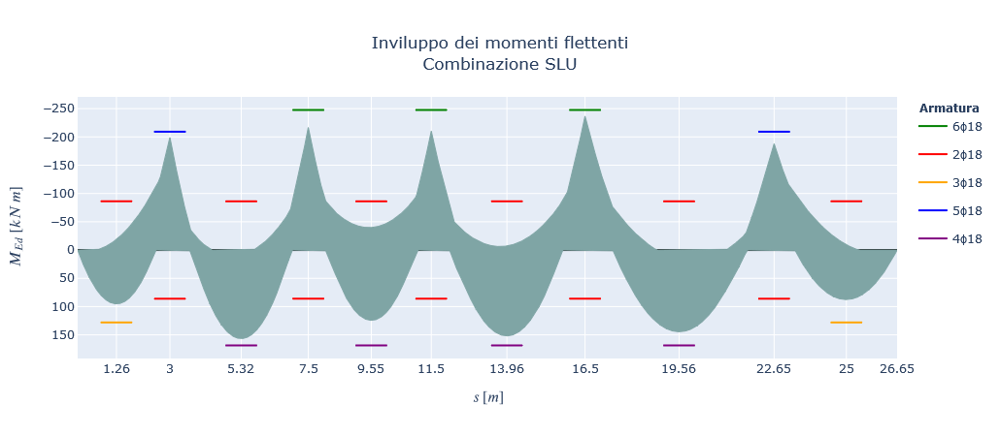

In [6]:
s = np.arange(0,26.65, .001)

MR1t = 50* np.ones(len(s))

fig = go.Figure()

fig.add_trace(go.Scatter(
    x = s,
    y = Mmax,
    name='M+',
    line_color='#7FA5A5',
    showlegend=False,
    line = dict(width=1)
))

fig.add_trace(go.Scatter(
    x = s,
    y = Mmin,
    name='M-',
    line_color='#7FA5A5',
    fill='tonexty',
    fillcolor='#7FA5A5',
    showlegend=False,
    line = dict(width=1)
))

#-------------------N5---------------------

fig.add_trace(go.Scatter(
    x = sn5, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn5, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    line_color='red'
))

#-------------------C1---------------------

fig.add_trace(go.Scatter(
    x = sc1, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc1, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N2---------------------

fig.add_trace(go.Scatter(
    x = sn2, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn2, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C2---------------------

fig.add_trace(go.Scatter(
    x = sc2, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc2, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N3---------------------

fig.add_trace(go.Scatter(
    x = sn3, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn3, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C3---------------------

fig.add_trace(go.Scatter(
    x = sc3, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc3, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N4---------------------

fig.add_trace(go.Scatter(
    x = sn4, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn4, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C4---------------------

fig.add_trace(go.Scatter(
    x = sc4, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc4, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C5---------------------

fig.add_trace(go.Scatter(
    x = sc5, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc5, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N6---------------------

fig.add_trace(go.Scatter(
    x = sn6, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    showlegend=False,
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn6, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C6---------------------

fig.add_trace(go.Scatter(
    x = sc6, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    showlegend=False,
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc6, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------------------------------

fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=s_plot,
        ticktext=s_plot,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 50,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)

fig.update_yaxes(automargin=True)
fig.update_layout(legend_title='<b> Armatura </b>')
fig.update_layout(showlegend=True)
fig.update_yaxes(zeroline=True, zerolinewidth=2, zerolinecolor='black')
fig.show()

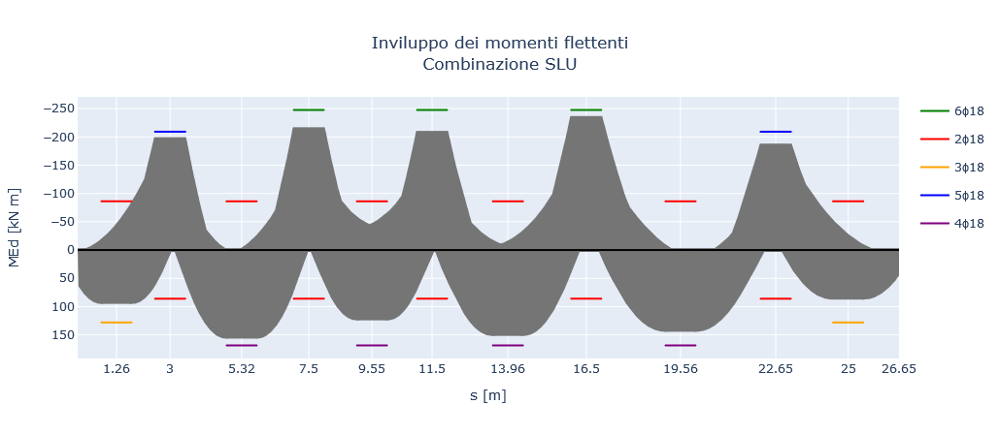

In [7]:

fig = go.Figure()
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='black')
fig.add_trace(go.Scatter(
    x = sc1,
    y = Mc1,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',  
    fill='tozeroy',
    showlegend=False,
    mode = 'none',
    line = dict(width=0,
               color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = sc2,
    y = Mc2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc3,
    y = Mc3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc4,
    y = Mc4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc5,
    y = Mc5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc6,
    y = Mc6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#--------------------------------------------------------

fig.add_trace(go.Scatter(
    x = s1,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


fig.add_trace(go.Scatter(
    x = s2,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#----------------------------------------------------------------------

fig.add_trace(go.Scatter(
    x = sn2,
    y = Mn2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn3,
    y = Mn3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn4,
    y = Mn4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn5,
    y = Mn5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn6,
    y = Mn6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#---------------------------------------------------------------


fig.add_trace(go.Scatter(
    x = s1,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = s2,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


#-----------------------------------------------------

#-------------------N5---------------------

fig.add_trace(go.Scatter(
    x = sn5, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn5, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    line_color='red'
))

#-------------------C1---------------------

fig.add_trace(go.Scatter(
    x = sc1, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc1, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N2---------------------

fig.add_trace(go.Scatter(
    x = sn2, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn2, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C2---------------------

fig.add_trace(go.Scatter(
    x = sc2, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc2, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N3---------------------

fig.add_trace(go.Scatter(
    x = sn3, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn3, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C3---------------------

fig.add_trace(go.Scatter(
    x = sc3, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc3, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N4---------------------

fig.add_trace(go.Scatter(
    x = sn4, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn4, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C4---------------------

fig.add_trace(go.Scatter(
    x = sc4, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc4, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C5---------------------

fig.add_trace(go.Scatter(
    x = sc5, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc5, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N6---------------------

fig.add_trace(go.Scatter(
    x = sn6, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    showlegend=False,
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn6, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C6---------------------

fig.add_trace(go.Scatter(
    x = sc6, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    showlegend=False,
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc6, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------------------------------
fig.add_trace(go.Scatter(
    x = s,
    y = s*0,
    line = dict(color='black', width=2),
    showlegend=False,
))
#------------------------------------------------------


fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=s_plot,
        ticktext=s_plot,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 50,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)
fig.update_yaxes(automargin=True)
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='black')
fig.update_xaxes(title_text='s [m]')
fig.update_yaxes(title_text='MEd [kN m]')

fig.show()

In [8]:
sc1_urq = np.array([0, 1.757])
sc2_urq = np.array([3.95,6.47])
sc3_urq = np.array([8.59, 10.38])
sc4_urq = np.array([12.5, 15.2])
sc5_urq = np.array([17.8, 21.6])
sc6_urq = np.array([24, 26.65])

sn2_urq = np.array([sc1_urq[1], sc2_urq[0]])
sn3_urq = np.array([sc2_urq[1], sc3_urq[0]])
sn4_urq = np.array([sc3_urq[1], sc4_urq[0]])
sn5_urq = np.array([sc4_urq[1], sc5_urq[0]])
sn6_urq = np.array([sc5_urq[1], sc6_urq[0]])

sn2_drq = np.array([2.17, 3.7])
sn3_drq = np.array([6.9, 8.2])
sn4_drq = np.array([10.88, 12.3])
sn5_drq = np.array([15.6, 17.7])
sn6_drq = np.array([21.4, 24.2])

sc1_drq = np.array([0, sn2_drq[0]])
sc2_drq = np.array([sn2_drq[1], sn3_drq[0]])
sc3_drq = np.array([sn3_drq[1], sn4_drq[0]])
sc4_drq = np.array([sn4_drq[1], sn5_drq[0]])
sc5_drq = np.array([sn5_drq[1], sn6_drq[0]])
sc6_drq = np.array([sn6_drq[1], 26.65])

In [9]:

fig = go.Figure()

fig.add_trace(go.Scatter(
    x = ss,
    y = Mmax,
    line_color='green',
    #fillcolor='rgba(117, 117, 117, 1)',  
    #fill='tozeroy',
    showlegend=False,
    mode = 'none',
    #line = dict(width=0,
     #          color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = ss,
    y = Mmin,
    line_color='green',
    #fillcolor='rgba(117, 117, 117, 1)',  
    #fill='tozeroy',
    showlegend=False,
    mode = 'none',
    #line = dict(width=0,
     #          color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = sc1,
    y = Mc1,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',  
    fill='tozeroy',
    showlegend=False,
    mode = 'none',
    line = dict(width=0,
               color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = sc2,
    y = Mc2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc3,
    y = Mc3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc4,
    y = Mc4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc5,
    y = Mc5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc6,
    y = Mc6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#--------------------------------------------------------

fig.add_trace(go.Scatter(
    x = s1,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


fig.add_trace(go.Scatter(
    x = s2,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#----------------------------------------------------------------------

fig.add_trace(go.Scatter(
    x = sn2,
    y = Mn2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn3,
    y = Mn3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn4,
    y = Mn4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn5,
    y = Mn5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn6,
    y = Mn6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#---------------------------------------------------------------


fig.add_trace(go.Scatter(
    x = s1,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = s2,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


#-----------------------------------------------------

#-------------------N5---------------------

fig.add_trace(go.Scatter(
    x = sn5_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn5_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    line_color='red'
))

#-------------------C1---------------------

fig.add_trace(go.Scatter(
    x = sc1_drq, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc1_urq, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N2---------------------

fig.add_trace(go.Scatter(
    x = sn2_urq, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn2_drq, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C2---------------------

fig.add_trace(go.Scatter(
    x = sc2_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc2_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N3---------------------

fig.add_trace(go.Scatter(
    x = sn3_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn3_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C3---------------------

fig.add_trace(go.Scatter(
    x = sc3_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc3_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N4---------------------

fig.add_trace(go.Scatter(
    x = sn4_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn4_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C4---------------------

fig.add_trace(go.Scatter(
    x = sc4_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc4_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C5---------------------

fig.add_trace(go.Scatter(
    x = sc5_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc5_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N6---------------------

fig.add_trace(go.Scatter(
    x = sn6_urq, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    showlegend=False,
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn6_drq, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C6---------------------

fig.add_trace(go.Scatter(
    x = sc6_drq, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    showlegend=False,
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc6_urq, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------------------------------
fig.add_trace(go.Scatter(
    x = s,
    y = s*0,
    line = dict(color='black', width=2),
    showlegend=False,
))
#------------------------------------------------------


fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=s_plot,
        ticktext=s_plot,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 50,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)
fig.update_yaxes(automargin=True)
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='black')
fig.update_xaxes(title_text='s [m]')
fig.update_yaxes(title_text='MEd [kN m]')

plotly.io.orca.config.executable = '/usr/local/bin/orca'
plotly.io.orca.config.save()

if not os.path.exists("images"):
    os.mkdir("images")
    
fig.write_image("images/fig1.eps")


fig.show()

NameError: name 'ss' is not defined

In [ ]:
# sc1_urq = np.array([0, 1.757+.69])
# sc2_urq = np.array([3.95-.69,6.47+.69])
# sc3_urq = np.array([8.59-.69, 10.38+.69])
# sc4_urq = np.array([12.5-.69, 15.2+.69])
# sc5_urq = np.array([17.8-.69, 21.6+.69])
# sc6_urq = np.array([24-.69, 26.65+.69])

# sn2_urq = np.array([sc1_urq[1]-.69-.762, sc2_urq[0]+.69+.762])
# sn3_urq = np.array([sc2_urq[1]-.69-.766, sc3_urq[0]+.69+.766])
# sn4_urq = np.array([sc3_urq[1]-.69-.766, sc4_urq[0]+.69+.766])
# sn5_urq = np.array([sc4_urq[1]-.69-.766, sc5_urq[0]+.69+.766])
# sn6_urq = np.array([sc5_urq[1]-.69-.762, sc6_urq[0]+.69+.762])

# sn2_drq = np.array([2.17-.69, 3.7+.69])
# sn3_drq = np.array([6.9-.69, 8.2+.69])
# sn4_drq = np.array([10.88-.69, 12.3+.69])
# sn5_drq = np.array([15.6-.69, 17.7+.69])
# sn6_drq = np.array([21.4-.69, 24.2+.69])

# sc1_drq = np.array([0, sn2_drq[0]+.69*2])
# sc2_drq = np.array([sn2_drq[1]-.69, sn3_drq[0]+.69+.703])
# sc3_drq = np.array([sn3_drq[1]-.69, sn4_drq[0]+.69+.703])
# sc4_drq = np.array([sn4_drq[1]-.69, sn5_drq[0]+.69+.703])
# sc5_drq = np.array([sn5_drq[1]-.69, sn6_drq[0]+.69+.703])
# sc6_drq = np.array([sn6_drq[1]-.69, 26.65])


#---------------------------------------------------------------


fig = go.Figure()

fig.add_trace(go.Scatter(
    x = ss,
    y = Mmax,
    line_color='green',
    #fillcolor='rgba(117, 117, 117, 1)',  
    #fill='tozeroy',
    showlegend=False,
    mode = 'none',
    #line = dict(width=0,
     #          color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = ss,
    y = Mmin,
    line_color='green',
    #fillcolor='rgba(117, 117, 117, 1)',  
    #fill='tozeroy',
    showlegend=False,
    mode = 'none',
    #line = dict(width=0,
     #          color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = sc1,
    y = Mc1,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',  
    fill='tozeroy',
    showlegend=False,
    mode = 'none',
    line = dict(width=0,
               color='rgba(255,255,255,0)',),
))

fig.add_trace(go.Scatter(
    x = sc2,
    y = Mc2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc3,
    y = Mc3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc4,
    y = Mc4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc5,
    y = Mc5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sc6,
    y = Mc6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#--------------------------------------------------------

fig.add_trace(go.Scatter(
    x = s1,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


fig.add_trace(go.Scatter(
    x = s2,
    y = Mmax,
    name='M+',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#----------------------------------------------------------------------

fig.add_trace(go.Scatter(
    x = sn2,
    y = Mn2,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn3,
    y = Mn3,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn4,
    y = Mn4,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn5,
    y = Mn5,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = sn6,
    y = Mn6,
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none', 
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

#---------------------------------------------------------------


fig.add_trace(go.Scatter(
    x = s1,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))

fig.add_trace(go.Scatter(
    x = s2,
    y = Mmin,
     name='M-',
    line_color='gray',
    fillcolor='rgba(117, 117, 117, 1)',
    mode = 'none',
    fill='tozeroy',
    showlegend=False,
    line = dict(width=0)
))


#-----------------------------------------------------

#-------------------N5---------------------

fig.add_trace(go.Scatter(
    x = sn5_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn5_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    line_color='red'
))

#-------------------C1---------------------

fig.add_trace(go.Scatter(
    x = sc1_drq, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc1_urq, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N2---------------------

fig.add_trace(go.Scatter(
    x = sn2_urq, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn2_drq, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C2---------------------

fig.add_trace(go.Scatter(
    x = sc2_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc2_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N3---------------------

fig.add_trace(go.Scatter(
    x = sn3_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn3_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C3---------------------

fig.add_trace(go.Scatter(
    x = sc3_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc3_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N4---------------------

fig.add_trace(go.Scatter(
    x = sn4_urq, 
    y = -247.64*np.ones(len(sn5)),
    legendgroup='6',
    name='6ϕ18',
    showlegend=False,
    line_color='green'
))

fig.add_trace(go.Scatter(
    x = sn4_drq, 
    y = 86*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C4---------------------

fig.add_trace(go.Scatter(
    x = sc4_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc4_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C5---------------------

fig.add_trace(go.Scatter(
    x = sc5_drq, 
    y = 168.63*np.ones(len(sn5)),
    legendgroup='4',
    name='4ϕ18',
    showlegend=False,
    line_color='purple'
))

fig.add_trace(go.Scatter(
    x = sc5_urq, 
    y = -86.126*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------N6---------------------

fig.add_trace(go.Scatter(
    x = sn6_urq, 
    y = -209.194*np.ones(len(sn5)),
    legendgroup='5',
    name='5ϕ18',
    showlegend=False,
    line_color='blue'
))

fig.add_trace(go.Scatter(
    x = sn6_drq, 
    y = 86.06*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------C6---------------------

fig.add_trace(go.Scatter(
    x = sc6_drq, 
    y = 128.025*np.ones(len(sn5)),
    legendgroup='3',
    name='3ϕ18',
    showlegend=False,
    line_color='orange'
))

fig.add_trace(go.Scatter(
    x = sc6_urq, 
    y = -86.20*np.ones(len(sn5)),
    legendgroup='2',
    name='2ϕ18',
    showlegend=False,
    line_color='red'
))

#-------------------------------------------
fig.add_trace(go.Scatter(
    x = s,
    y = s*0,
    line = dict(color='black', width=2),
    showlegend=False,
))
#------------------------------------------------------


fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=s_plot,
        ticktext=s_plot,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 50,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)
fig.update_yaxes(automargin=True)
fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='black')
fig.update_xaxes(title_text='s [m]')
fig.update_yaxes(title_text='MEd [kN m]')

plotly.io.orca.config.executable = '/usr/local/bin/orca'
plotly.io.orca.config.save()

if not os.path.exists("images"):
    os.mkdir("images")
    
fig.write_image("images/fig1.eps")


fig.show()

In [ ]:
# s = np.arange(0,26.65, .001)


# ss = np.arange(0,26.65, .001)

# for i in range (0,1261):
#     ss[i] = s2[i]

# for i in range(1261, 3001):
#     ss[i] = s1[i]

# for i in range(3001, 5320):
#     ss[i] = s2[i]
    
# for i in range(5320, 7501):
#     ss[i] = s1[i]
    
# for i in range(7501, 9551):
#     ss[i] = s2[i]

# for i in range(9551, 11501):
#     ss[i] = s1[i]
    
# for i in range(11501, 13961):
#     ss[i] = s2[i]

# for i in range(13961, 16501):
#     ss[i] = s1[i]

# for i in range(16501, 19561):
#     ss[i] = s2[i]
    
# for i in range(19561, 22651):
#     ss[i] = s1[i]
    
# for i in range(22651, 25001):
#     ss[i] = s2[i]
    
# for i in range(25001,26650):
#     ss[i] = s1[i]
    
# # #--------------------------------------------
# ssup = s1

# for i in range (0,3001):
#     ssup[i] = s2[i]

# for i in range (3001,5000):
#     ssup[i] = s1[i]
    
# for i in range(5000, 7501):
#     ssup[i] = s2[i]
    
# for i in range(7501, 8953):
#     ssup[i] = s1[i]

# for i in range(8953, 11501):
#     ssup[i] = s2[i]
    
# for i in range(11501, 13961):
#     ssup[i] = s1[i]

# for i in range(13961, 16501):
#     ssup[i] = s2[i]

# for i in range(16501, 19561):
#     ssup[i] = s1[i]
    
# for i in range(19561, 22651):
#     ssup[i] = s2[i]
    
# for i in range(22651, 25001):
#     ssup[i] = s1[i]
    
# for i in range(25001,26650):
#     ssup[i] = s2[i]

In [ ]:

# fig = go.Figure()
# fig.add_trace(go.Scatter(
#     x = ss,
#     y = Mmax,
#     line_color='green',
#     #fillcolor='rgba(117, 117, 117, 1)',  
#     #fill='tozeroy',
#     showlegend=False,
#     mode = 'none',
#     #line = dict(width=0,
#      #          color='rgba(255,255,255,0)',),
# ))

# fig.add_trace(go.Scatter(
#     x = ssup,
#     y = Mmin,
#     line_color='green',
#     #fillcolor='rgba(117, 117, 117, 1)',  
#     fill='tonexty',
#     showlegend=False,
#     mode = 'none',
#     #line = dict(width=0,
#      #          color='rgba(255,255,255,0)',),
# ))



# fig.update_yaxes(autorange="reversed")
# fig.update_traces(mode='lines')
# fig.update_layout(
#     title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
#     title_x=.5,
#     autosize=True,
#     xaxis = dict(
#         tickmode='array',
#         tickvals=s_plot,
#         ticktext=s_plot,
#         title=r'$s\,[m]$',
#     ),
#     yaxis = dict(
#         tickmode = 'linear',
#         tick0 = 0,
#         dtick = 50,
#         title=r'$M_{Ed}\,[kN\,m]$'
#     ),
#     xaxis_showgrid=True, 
#     yaxis_showgrid=True,
# )
# fig.update_yaxes(automargin=True)
# fig.update_yaxes(zeroline=True, zerolinewidth=3, zerolinecolor='black')
# fig.update_xaxes(title_text='s [m]')
# fig.update_yaxes(title_text='MEd [kN m]')

# plotly.io.orca.config.executable = '/usr/local/bin/orca'
# plotly.io.orca.config.save()

# if not os.path.exists("images"):
#     os.mkdir("images")
    
# fig.write_image("images/fig1.eps")


# fig.show()

In [ ]:
eqt = b*fcd*x/epsilon_c2 * (1-1/3 * (epsilon_cs/epsilon_c2)) + A1s*Es* (x-d2)/x - As*Es* (d-x)/x 
eqt

In [ ]:
mylambda_0 = (1-(1/4)*(epsilon_cs/epsilon_c2))/(3-(epsilon_cs/epsilon_c2))
mylambda_0

In [ ]:
# eqr = x**2 - ((1-mylambda_0)*(As*d+A1s*d2)+MEd)/((As+A1s)*mylambda_0) + (As*d**2 + A1s*d2**2)/((As+A1s)*mylambda_0)
eqr = A1s*Es*epsilon_cs*(x-d2)/x * (mylambda_0*x - d2) + As*Es*epsilon_cs* (d-x)/x * (d-mylambda_0 * x) - MEd
eqr = sym.simplify(eqr)
eqr

In [ ]:
epsilon_cs0 = sym.solve(eqr.subs({epsilon_c2:2/1000, As:243*np.pi, A1s:162*np.pi, d2:40, d:460, MEd:61.53*10**6, Es:210*10**3, x:x0}), epsilon_cs)
epsilon_cs0

In [ ]:
x0 = sym.solve(
    eqt.subs({A1s:162*np.pi, d2:40, d:460, Es:210*10**3, epsilon_c2:2/1000, b:300, fcd:14.17})
    ,x)[0]
x0

In [ ]:
epsilon_cs0.subs({x:331.5})

In [ ]:
(460 - 331.5)/331.5 * epsilon_cs0.subs({x:371.677})

---

## Progetto sezione N5

Si ipotizzi di essere sulla retta limite tra il campo 2 e il campo 3. In questo modo:
$$
\xi_{2/3} = \dfrac{\varepsilon_{cu}}{\varepsilon_{cu} + \varepsilon_{su}}
$$

Assumendo 
\begin{align*}
\varepsilon_{cu} &= 0.35\%\\
\varepsilon_{su} &= 1.0\%
\end{align*}
risulta
$$
\xi_{2/3} = 0.2593
$$

Essendo sulla retta limite tra i campi 2 e 3, i valori di $\psi$ e $\lambda$ sono costanti e valgono
\begin{align*}
\psi &= 0.80952\\
\lambda &= 0.416
\end{align*}

In [ ]:
b, psi, xi, d, fcd, beta, As, fyd, d2, MEd, mylambda, x, A1s, Es, epsilon_su, epsilon_cs, epsilon_c2 = symbols('b psi xi d fcd beta As fyd d2 MEd mylambda x A1s Es epsilon_su epsilon_cs epsilon_c2')
type(d)

In [ ]:
MEd_N5 = 234.169 #kN m

In [ ]:
eq = b*psi*xi*d**2 * fcd* (1-mylambda) + beta* (b*psi*xi*d*fcd / (1-beta)) * (d-d2) - MEd
type(eq)

In [ ]:
eq.subs({b:300, psi:0.806399941030868, xi:0.256147482947766, fcd:14.17, beta:0.3, mylambda:0.41481981971363, fyd:391.3, d2:40, MEd:234.169*10**6})

In [ ]:
num_eq = eq.subs({b:300, psi:0.80952, xi:0.2593, fcd:14.17, beta:0.3, mylambda:0.416, fyd:391.3, d2:40, MEd:234.169*10**6})

In [ ]:
d_sol=sym.solve(num_eq, d)
d_sol[1]

In [ ]:
sol_As = b*psi*xi*d*fcd / (fyd*(1-beta))
sol_As

In [ ]:
num_As = sol_As.subs({b:300, psi:0.80952, xi:0.2593, fcd:14.17, beta:0.3, fyd:391.3, d:d_sol[1]})
num_As

In [ ]:
num_A1s = .3 * num_As
num_A1s

Adottando
\begin{align}
d &= 460\,mm\\
\end{align}
si ottiene

In [ ]:
d_sol1=460 #è verificata anche con d = 460mm

In [ ]:
num1_As = sol_As.subs({b:300, psi:0.80952, xi:0.2593, fcd:14.17, beta:0.3, fyd:391.3, d:d_sol1})
num1_As

In [ ]:
num1_A1s = .3 * num1_As
num1_A1s

Si sceglie allora
\begin{align}
A_s &= 6\Phi\,18mm = 486\pi\,mm^2\\
A'_s &= 2\Phi\,18mm = 162\pi\,mm^2
\end{align}

In [ ]:
As_sol1 = np.pi*6*18**2 /4 #mm**2
A1s_sol1 = np.pi*2*18**2 /4 #mm**2

## Verifica sezione N5
Se ipotizziamo di essere in campo 3, $\psi$ e $\lambda$ sono costanti. Il copriferro superiore al limite elastico tra i campi 2 e 3 vale
$$
d''_{\varepsilon'_{2/3}} = \dfrac{\varepsilon_{cu} - \varepsilon'_{se}}{\varepsilon_{cu}}\,x_{2/3} = \dfrac{0.35-0.1863}{0.35}\%\,\cdot0.2593 \cdot 560\,mm = 55.788\,mm 
$$

Poiché $d'' = 40\,mm < d''_{\varepsilon'_{2/3}} = 67.916\,mm$ le armature superiori snervano in campo 2, sottocampo 2b).

Allora
$$
b\,\psi\,x\,fcd + A'_s\,f'_{yd} - A_s\,f_{yd} = 0
$$

da cui si ricava $x$

In [ ]:
eq2 = b*psi*x*fcd+A1s*fyd-As*fyd
sol_eq2 = eq2.subs({b:300, psi:0.80952, fcd:14.17, A1s:A1s_sol1, As:As_sol1, fyd:391.3})
x2 = sym.solve(sol_eq2, x)
sol_eq2, x2
x2 = x2[0]
xi2 = x2/d_sol1
print(xi2,'< 0.2593')
xi2 < 0.2593

L'ipotesi di campo 3 è **errata**!

Si ipotizza di essere in campo 2. Allora $\{\psi, \lambda\} \neq cost$.

**HP: sottocampo 2b ($\sigma'_s = f_{yd}$)**

Se $\varepsilon_c \in [\varepsilon_{c2}, \varepsilon_{cu}]$ allora
$$
\psi = 1 - \dfrac{1}{3}\,\dfrac{\varepsilon_{c2}}{\varepsilon_{c}} = 1 - \dfrac{1}{3}\,\dfrac{\varepsilon_{c2}}{\varepsilon_{su}}\,\dfrac{1-\xi}{\xi} = 1 - \dfrac{1}{3}\,\dfrac{2}{10}\cdot\dfrac{1-\xi}{\xi} = \frac{16 \xi - 1}{15 \xi}
$$

In [ ]:
sym.simplify(1-(1/3) * (2/10) * (1-xi)/xi, rational=True)

Essendo per ipotesi in campo 2b, le equazioni di equilibrio risultano
\begin{align}
b\,\psi\,\dfrac{x}{d}\,d\,f_{cd} + A'_s\,f_{yd} - A_s\,f_{yd} &= 0
\end{align}
cioè
$$
b\,\psi\,\xi\,d\,f_{cd} = f_{yd}\,(A_s - A'_s)
$$
ovvero
$$ 
\psi\,\xi = \dfrac{f_{yd}\,(A_s - A'_s)}{b\,d\,f_{cd}}
$$
Sostituendo la relazione di $\psi$ trovata sopra
$$
\frac{16 \xi - 1}{15 \xi}\,\xi = \dfrac{f_{yd}\,(A_s - A'_s)}{b\,d\,f_{cd}}
$$

In [ ]:
eq3 = (16*xi-1)/(15*xi)*xi - (fyd*(As-A1s))/(b*d*fcd)
eq3

In [ ]:
sym.solve(eq3, xi)[0]

In [ ]:
num_eq3 = eq3.subs({fyd:391.3, As:As_sol1, A1s:A1s_sol1, b:300, d:d_sol1, fcd:14.17})
xi3 = sym.solve(num_eq3, xi)[0]
xi3

Risolvendo si ottiene
$$\xi = 0.253453257098057$$

Il limite di $\xi$ per il campo elastico delle armature superiori è 
$$
\xi_{\varepsilon'_{se_{2a/2b}}} = \dfrac{1}{d}\left[\dfrac{\varepsilon'_{se}}{\varepsilon'_{se} + \varepsilon_{su}}\,(d-d'') + d''\right] = \dfrac{1}{460}\left[\dfrac{1.863}{1.863 + 10}\,(460-40) + 40\right] = 0.23034352334074892
$$

In [ ]:
sym.simplify((1.863/(1.863+10)) * (d-d2) + d2, rational=True)

In [ ]:
xi3lim_2a2b = ((1.863/(1.863+10)) * (d-d2) + d2).subs({d:d_sol1, d2:40})/d_sol1

In [ ]:
print(xi3, '<', xi3lim_2a2b)
xi3 < xi3lim_2a2b

Inoltre la deformazione delle armature superiori

In [ ]:
print('epsilon1_s =', (10/1000)/(d_sol1 - xi3*d_sol1) * (xi3*d_sol1 - 40), '> epsilon1_se = ',1.863/1000)
(10/1000)/(d_sol1 - xi3*d_sol1) * (xi3*d_sol1 - 40) > 1.863/1000 
#epsilon'_s > epsilon'_se => OK CAMPO 2B

Ci si trova effettivamente in campo 2b. Allora
$$
\sigma'_s = f_{yd}
$$

È necessario verificare in che campo di deformazioni è il cls

In [ ]:
epsilon_c = (10/1000) * (xi3*d_sol1)/(d_sol1*(1-xi3)) 

print('epsilon_c =', epsilon_c,'< epsilon_c2 = .002')

epsilon_c < 2/1000


#epsilon_c > epsilon_c2 => OK psi calcolato sopra!!!

Il cls ha deformazione
$$
\varepsilon_c \in [\varepsilon_{c2}, \varepsilon_{cu}]
$$
perciò i valori di $\psi$ e $\lambda$ calcolati sopra sono corretti.

In [ ]:
psi3 = sym.simplify(1-(1/3) * (2/10) * (1-xi)/xi, rational=True).subs({xi:xi3})
psi3

In [ ]:
mylambda3 = (6*((10/1000) * (xi3*d_sol1)/(d_sol1*(1-xi3)))**2 - 4*((10/1000) * (xi3*d_sol1)/(d_sol1*(1-xi3))) * 2/1000 + (2/1000)**2)/(4*((10/1000) * (xi3*d_sol1)/(d_sol1*(1-xi3)))*(3*((10/1000) * (xi3*d_sol1)/(d_sol1*(1-xi3)))-(2/1000)))
mylambda3

Sono verificate le ipotesi di $\varepsilon_c  = 0.344\% \in [\varepsilon_{c2}, \varepsilon_{cu}] = [0.2, 0.35]\%$ e di campo 2b con le armature superiori snervate, essendo $\varepsilon'_{s} = 0.223\% > 0.1863\% = \varepsilon'_{se}$.

Allora, i valori di $\psi$ e $\lambda$ sono
\begin{align}
\psi &= 0.803633287534062\\
\lambda &= 0.413812129258617
\end{align}

In [ ]:
MRd = b*psi*xi*d*fcd*(d-mylambda*xi*d) + A1s*fyd*(d-d2)
MRd = MRd.subs({b:300, psi:psi3, xi:xi3, mylambda:mylambda3, d:d_sol1, fcd:14.17, A1s:A1s_sol1, fyd:391.3, d2:40})/10**6
print(MRd, 'kN m')

In [ ]:
MRd > MEd_N5

### La sezione N5 è verificata!

In [ ]:
bmin = 6*18+2*10+5*25+2*20
bmin

In [ ]:
bmin < 300

Usando
$$
d = 560\,mm \quad A_s = 6\,\Phi 20\,mm\quad A'_s = 2\,\Phi 20\,mm
$$
la sezione è largamente verificata ma è necessario distribuire le armature metalliche inferiori su due file, oltre ad avere una trave molto alta.

Usando, in alternativa, 
$$
d = 460\,mm \quad A_s = 6\,\Phi 18\,mm \quad A'_s = 2\,\Phi 18\,mm
$$ 
la trave è comunque verificata agli SLU (campo 2b come in precedenza) e inoltre l'armatura può essere contenuta tutta su una fila (in prima approssimazione e salvo calcoli corretti).

<!--È necessario mettere le armature tese su due file!-->

---

## Progetto sezione C1

Si ipotizzi di essere sulla retta limite tra il campo 2 e il campo 3. In questo modo:
$$
\xi_{2/3} = \dfrac{\varepsilon_{cu}}{\varepsilon_{cu} + \varepsilon_{su}}
$$

Assumendo 
\begin{align*}
\varepsilon_{cu} &= 0.35\%\\
\varepsilon_{su} &= 1.0\%
\end{align*}
risulta
$$
\xi_{2/3} = 0.2593
$$

Essendo sulla retta limite tra i campi 2 e 3, i valori di $\psi$ e $\lambda$ sono costanti e valgono
\begin{align*}
\psi &= 0.80952\\
\lambda &= 0.416
\end{align*}

Inoltre sono note le caratteristiche geometriche della sezione
\begin{align}
b &= 300\,mm\\
d &= 460\,mm
\end{align}

Per calcolare le armature si fa l'equilibrio alla rotazione attorno a $T'_s$
$$
-b\,\psi\,\xi\,d\,f_{cd}\,(\lambda\,\xi\,d - d'') + A_s\,f_{yd}\,(d-d'') = M_{Ed}^{C1}
$$

dove 
$$
M_{Ed}^{C1} = 95.1842\,kN\,m
$$

In [ ]:
MEd_C1 = 95.1842*10**6

In [ ]:
eq = -b*psi*xi*d*fcd*(mylambda* xi *d - d2) + As * fyd *(d-d2) - MEd
eq

In [ ]:
eq = eq.subs({b:300, d:d_sol1, d2:40, fyd:391.3, fcd:14.17, psi:0.80952, mylambda:0.416, xi:.2593, MEd:MEd_C1})
eq_sol = sym.solve(eq, As)[0]
eq_sol

Si adottano
\begin{align}
A_s &= 3\Phi 18\,mm = 243\pi\,mm^2\\
A'_s &= 2\Phi 18\,mm = 162\pi\,mm^2
\end{align}

In [ ]:
As_sol1 = 3*np.pi * 18**2 /4
A1s_sol1 = 2* np.pi *18**2 /4

print(As_sol1, A1s_sol1)

## Verifica sezione C1
Se ipotizziamo di essere in campo 3, $\psi$ e $\lambda$ sono costanti. Il copriferro superiore al limite elastico tra i campi 2 e 3 vale
$$
d''_{\varepsilon'_{2/3}} = \dfrac{\varepsilon_{cu} - \varepsilon'_{se}}{\varepsilon_{cu}}\,x_{2/3} = \dfrac{0.35-0.1863}{0.35}\%\,\cdot0.2593 \cdot 460\,mm = 55.788\,mm 
$$

Poiché $d'' = 40\,mm < d''_{\varepsilon'_{2/3}} = 55.788\,mm$ le armature superiori snervano in campo 2, sottocampo 2b).

Allora
$$
b\,\psi\,x\,fcd + A'_s\,f'_{yd} - A_s\,f_{yd} = 0
$$

da cui si ricava $x$

In [ ]:
eq2 = (16*xi -1)/(15*xi) * xi - (fyd * (As - A1s))/(b*d*fcd)
eq2

In [ ]:
eq2 = eq2.subs({fyd:391.3, A1s:A1s_sol1, As:As_sol1, b:300, d:d_sol1, fcd:14.17})
eq2

In [ ]:
xi1 = sym.solve(eq2, xi)[0]
xi1

$$
\xi = 0.110238314274515 < \xi_{2a/2b} = 0.23034
$$

Ci si trova in campo 2a. **Le armature superiori sono in campo elastico**
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} = 0.026\,\%< 0.1863\,\% = \varepsilon'_{se}
$$
Si deve ricalcolare il valore di $\xi$ corretto da
$$
b\,\psi\,\xi\,d\,f_{cd} + A'_s\,\sigma'_s - A_s\,f_{yd} = 0
$$
cioè
$$
b\,\psi\,\xi\,d\,f_{cd} + A'_s\,E_s\,\varepsilon'_s - A_s\,f_{yd} = 0
$$
dove
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)}
$$
In definitiva l'equazione da risolvere è
$$
b\,\dfrac{16\,\xi -1}{15\xi}\,\xi\,d\,f_{cd} + A'_s\,E_s\, \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} - A_s\,f_{yd} = 0
$$

In [ ]:
eq3 = b*((16*xi-1)/(15*xi)) * xi * d * fcd + A1s*Es*(epsilon_su)*((xi*d-d2)/(d*(1-xi)))- As*fyd
eq3

In [ ]:
eq3 = eq3.subs({b:300, d:d_sol1, As:As_sol1, A1s:A1s_sol1, fyd:391.3, fcd:14.17, Es:210*10**3, epsilon_su:10/1000, d2:40})
eq3

In [ ]:
xi2 = sym.solve(eq3, xi)[0]
print(xi2, '< xi_2a2b = 0.23034')
xi2 < 0.23034

In [ ]:
10/1000 * (xi2*d_sol1 - 40)/(d_sol1 - xi2*d_sol1)

In [ ]:
epsilon_c2 = 2/1000
epsilon_cu = 3.5/1000
epsilon_su = 10/1000

Ci si trova effettivamente in campo 2a.
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} = 0.08785\% < \varepsilon'_{se}
$$
$$
\dfrac{\varepsilon_{su} + \varepsilon_c}{d} = \dfrac{\varepsilon_{su}}{d(1-\xi)}
$$
da cui
$$
\varepsilon_c = 0.1914\% < \varepsilon_{c2} = 0.2\%
$$
e perciò si deve ricalcolare $\psi$ e $\lambda$ con
$$
\psi = \dfrac{\varepsilon_c}{3\varepsilon_{c2}^2}\,(3\varepsilon_{c2} - \varepsilon_c) = \dfrac{\xi}{1-\xi}\,\dfrac{\varepsilon_{su}}{3\varepsilon_{c2}^2}\,(3\varepsilon_{c2} - \dfrac{\xi}{1-\xi}\,\varepsilon_{su}) 
$$

In [ ]:
eq3 = b*xi/(1-xi) * epsilon_su/(3*epsilon_c2**2) * (3*epsilon_c2-(xi/(1-xi))*epsilon_su) * xi*d*fcd + A1s*Es*epsilon_su* ((xi*d-d2)/(d-xi*d)) - As*fyd
eq3 = eq3.subs({b:300, d:d_sol1, fcd:14.17, A1s:A1s_sol1, Es:210*10**3, d2:40, As:As_sol1, fyd:391.3})
xi3 = sym.solve(eq3, xi)[1]
print(xi3 )
xi3 =0.160694044934078
xi3

In [ ]:
epsilon_c = symbols('epsilon_c')
eq4 = (epsilon_su/(d-xi*d) - (epsilon_su + epsilon_c)/d).subs({d:d_sol1, xi:xi3})
eq4_sol = sym.solve(eq4, epsilon_c)[0]
eq4_sol

In [ ]:
mylambda4 = (4*epsilon_c2 - eq4_sol)/(4*(3*epsilon_c2 - eq4_sol))
mylambda4

In [ ]:
psi4 = (eq4_sol/(3*epsilon_c2**2)) * (3*epsilon_c2 - eq4_sol)
psi4

$$
\xi = 0.16069405
$$
$$
\varepsilon_c = 0.19146\%
$$
$$
\lambda = \dfrac{4\varepsilon_{c2} - \varepsilon_c}{4\,(3\varepsilon_{c2} - \varepsilon_c)} = 0.372387224786834
$$
$$
\psi = \dfrac{\varepsilon_c}{3\varepsilon_{c2}^2}\,(3\varepsilon_{c2} - \varepsilon_c) = \dfrac{\xi}{1-\xi}\,\dfrac{\varepsilon_{su}}{3\varepsilon_{c2}^2}\,(3\varepsilon_{c2} - \dfrac{\xi}{1-\xi}\,\varepsilon_{su}) = 0.65182670538706
$$

In [ ]:
MRd_C1 = round((-b*psi*xi*d*fcd*(mylambda*xi*d-d2) + As*fyd*(d-d2)).subs({b:300, psi:psi4, xi:xi3, d:d_sol1, fcd:14.17, mylambda:mylambda4, d2:40, As:As_sol1, fyd:391.3}),4)
MRd_C1/10**6

In [ ]:
MRd_C1 > MEd_C1

### La sezione C1 è verificata!

---

## Progetto sezione N2

Si ipotizzi di essere sulla retta limite tra il campo 2 e il campo 3. In questo modo:
$$
\xi_{2/3} = \dfrac{\varepsilon_{cu}}{\varepsilon_{cu} + \varepsilon_{su}}
$$

Assumendo 
\begin{align*}
\varepsilon_{cu} &= 0.35\%\\
\varepsilon_{su} &= 1.0\%
\end{align*}
risulta
$$
\xi_{2/3} = 0.2593
$$

Essendo sulla retta limite tra i campi 2 e 3, i valori di $\psi$ e $\lambda$ sono costanti e valgono
\begin{align*}
\psi &= 0.80952\\
\lambda &= 0.416
\end{align*}

Inoltre sono note le caratteristiche geometriche della sezione
\begin{align}
b &= 300\,mm\\
d &= 460\,mm
\end{align}

Per calcolare le armature si fa l'equilibrio alla rotazione attorno a $T'_s$
$$
-b\,\psi\,\xi\,d\,f_{cd}\,(\lambda\,\xi\,d - d'') + A_s\,f_{yd}\,(d-d'') = M_{Ed}^{C1}
$$

dove 
$$
M_{Ed}^{C1} = -196.506\,kN\,m
$$

In [ ]:
MEd_N2 = 196.506*10**6

In [ ]:
eq = -b*psi*xi*d*fcd*(mylambda* xi *d - d2) + As * fyd *(d-d2) - MEd
eq

In [ ]:
eq = eq.subs({b:300, d:d_sol1, d2:40, fyd:391.3, fcd:14.17, psi:0.80952, mylambda:0.416, xi:.2593, MEd:MEd_N2})
eq_sol = sym.solve(eq, As)[0]
print(eq_sol)
print(eq_sol*.3)

Si adottano
\begin{align}
A_s &= 5\Phi 18\,mm = 405\pi\,mm^2\\
A'_s &= 2\Phi 18\,mm = 162\pi\,mm^2
\end{align}

In [ ]:
As_sol1 = round(5*np.pi * 18**2 /4,4)
A1s_sol1 = round(2* np.pi *18**2 /4,4)

print(As_sol1, A1s_sol1)

## Verifica sezione N2
Se ipotizziamo di essere in campo 3, $\psi$ e $\lambda$ sono costanti. Il copriferro superiore al limite elastico tra i campi 2 e 3 vale
$$
d''_{\varepsilon'_{2/3}} = \dfrac{\varepsilon_{cu} - \varepsilon'_{se}}{\varepsilon_{cu}}\,x_{2/3} = \dfrac{0.35-0.1863}{0.35}\%\,\cdot0.2593 \cdot 460\,mm = 55.788\,mm 
$$

Poiché $d'' = 40\,mm < d''_{\varepsilon'_{2/3}} = 55.788\,mm$ le armature superiori snervano in campo 2, sottocampo 2b).

Allora
$$
b\,\psi\,x\,fcd + A'_s\,f'_{yd} - A_s\,f_{yd} = 0
$$

da cui si ricava $x$

In [ ]:
eq2 = (16*xi -1)/(15*xi) * xi - (fyd * (As - A1s))/(b*d*fcd)
eq2

In [ ]:
eq2 = eq2.subs({fyd:391.3, A1s:A1s_sol1, As:As_sol1, b:300, d:d_sol1, fcd:14.17})
eq2

In [ ]:
xi1 = sym.solve(eq2, xi)[0]
xi1

$$
\xi = 0.20571494004288 < \xi_{2a/2b} = 0.23034
$$

Ci si trova in campo 2a. **Le armature superiori sono in campo elastico**
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} = 0.1495\,\%< 0.1863\,\% = \varepsilon'_{se}
$$
Si deve ricalcolare il valore di $\xi$ corretto da
$$
b\,\psi\,\xi\,d\,f_{cd} + A'_s\,\sigma'_s - A_s\,f_{yd} = 0
$$
cioè
$$
b\,\psi\,\xi\,d\,f_{cd} + A'_s\,E_s\,\varepsilon'_s - A_s\,f_{yd} = 0
$$
dove
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)}
$$
In definitiva l'equazione da risolvere è
$$
b\,\dfrac{16\,\xi -1}{15\xi}\,\xi\,d\,f_{cd} + A'_s\,E_s\, \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} - A_s\,f_{yd} = 0
$$

In [ ]:
eq3 = b*((16*xi-1)/(15*xi)) * xi * d * fcd + A1s*Es*(epsilon_su)*((xi*d-d2)/(d*(1-xi)))- As*fyd
eq3

In [ ]:
eq3 = eq3.subs({b:300, d:d_sol1, As:As_sol1, A1s:A1s_sol1, fyd:391.3, fcd:14.17, Es:210*10**3, epsilon_su:10/1000, d2:40})
eq3

In [ ]:
xi2 = sym.solve(eq3, xi)[0]
print(xi2, '< xi_2a2b = 0.23034')
xi2 < 0.23034

In [ ]:
10/1000 * (xi2*d_sol1 - 40)/(d_sol1 - xi2*d_sol1)

#epsilon1_s

In [ ]:
epsilon_c = (10/1000)*(xi2*d_sol1)/(d_sol1*(1-xi2))

#epsilon_c

In [ ]:
psi_2 = (16*xi2-1)/(15*xi2)
psi_2

In [ ]:
mylambda_2 = ((6*epsilon_c**2 - 4*epsilon_c*2/1000 + (2/1000)**2)/(4*epsilon_c*(3*epsilon_c-2/1000)))
mylambda_2

Ci si trova effettivamente in campo 2a.
$$
\varepsilon'_s = \varepsilon_{su} \,\dfrac{\xi\,d - d''}{d\,(1-\xi)} = 0.165316\% < \varepsilon'_{se}
$$
$$
\dfrac{\varepsilon_{su} + \varepsilon_c}{d} = \dfrac{\varepsilon_{su}}{d(1-\xi)}
$$
da cui
$$
\varepsilon_c = 0.2763\% > \varepsilon_{c2} = 0.2\%
$$
e perciò si deve ricalcolare $\psi$ e $\lambda$ con
$$
\psi = 1 - \dfrac{1}{3}\,\dfrac{\varepsilon_{c2}}{\varepsilon_{c}} = 1 - \dfrac{1}{3}\,\dfrac{\varepsilon_{c2}}{\varepsilon_{su}}\,\dfrac{1-\xi}{\xi} = 1 - \dfrac{1}{3}\,\dfrac{2}{10}\cdot\dfrac{1-\xi}{\xi} = \frac{16 \xi - 1}{15 \xi} = 0.758714991993199
$$
$$
\lambda = \dfrac{6\varepsilon_c^2 - 4\varepsilon_c\,\varepsilon_{c2} + \varepsilon_{c2}^2}{4\varepsilon_c\,(3\varepsilon_c - \varepsilon_{c2}} =0.39854073861841
$$

In [ ]:
MRd_N2 = -b*psi*xi*d*fcd*(mylambda*xi*d-d2) + As*fyd*(d-d2)
MRd_N2 = round(MRd_N2.subs({b:300, psi:psi_2, xi:xi2, d:d_sol1, fcd:14.17, mylambda:mylambda_2, d2:40, As:As_sol1, fyd:391.3}),4)
MRd_N2/10**6

In [ ]:
MRd_N2 > MEd_N2

### La sezione N2 è verificata!
---